# Image transforms

In [ ]:
from fastai.gen_doc.nbdoc import *
from fastai.vision import * 
from fastai import *

fastai provides a complete image transformation library written from scratch in PyTorch. Although the main purpose of the library is for data augmentation when training computer vision models, you can also use it for more general image transformation purposes. Before we get in to the detail of the full API, we'll look at a quick overview of the data augmentation pieces that you'll almost certainly need to use.

## Data augmentation

Data augmentation is perhaps the most important regularization technique when training a model for Computer Vision: instead of feeding the model with the same pictures every time, we do small random transformations (a bit of rotation, zoom, translation, etc...) that don't change what's inside the image (for the human eye) but change its pixel values. Models trained with data augmentation will then generalize better.

To get a set of transforms with default values that work pretty well in a wide range of tasks, it's often easiest to use [`get_transforms`](/vision.transform.html#get_transforms). Depending on the nature of the images in your data, you may want to adjust a few arguments, the most important being:

- `do_flip`: if True the image is randomly flipped (default beheavior)
- `flip_vert`: limit the flips to horizontal flips (when False) or to horizontal and vertical flips as well as 90-degrees rotations (when True)

[`get_transforms`](/vision.transform.html#get_transforms) returns a tuple of two list of transforms: one for the training set and one for the validation set (we don't want to modify the pictures in the validation set, so the second list of transforms is limited to resizing the pictures). This can be then passed directly to define a [`DataBunch`](/basic_data.html#DataBunch) object (see below) which is then associated with a model to begin training.

Note that the defaults got [`get_transforms`](/vision.transform.html#get_transforms) are generally pretty good for regular photos - although here we'll add a bit of extra rotation so it's easier to see the differences.

In [ ]:
tfms = get_transforms(max_rotate=25)
len(tfms)

2

We first define here a function to return a new image, since transformation functions modify their inputs. We also define a little helper function `plots_f` to let us output a grid of transformed images based on a function - the details of this function aren't important here.

In [ ]:
def get_ex(): return open_image('imgs/cat_example.jpg')

def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

If we want to have a look at what this transforms actually do, we need to use the [`apply_tfms`](/vision.image.html#apply_tfms) function. It will be in charge of picking the values of the random parameters and doing the transformation to the [`Image`](/vision.image.html#Image) object. This function has multiple arguments you can customize (see its documentation for details), we will highlight here the most useful. The first one we'll need to set, especially if our images are of different shapes, is the target `size`. It will ensure all the images are cropped or padded to the same size so we can then collate them into batches.

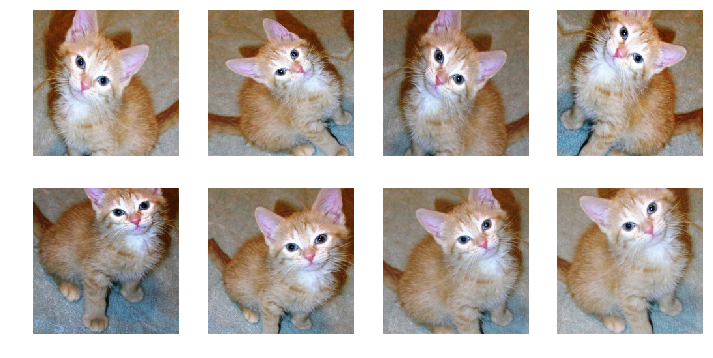

In [ ]:
plots_f(2, 4, 12, 6, size=224)

Note that the target `size` can be a rectangle if you specify a tuple of int (height by width).

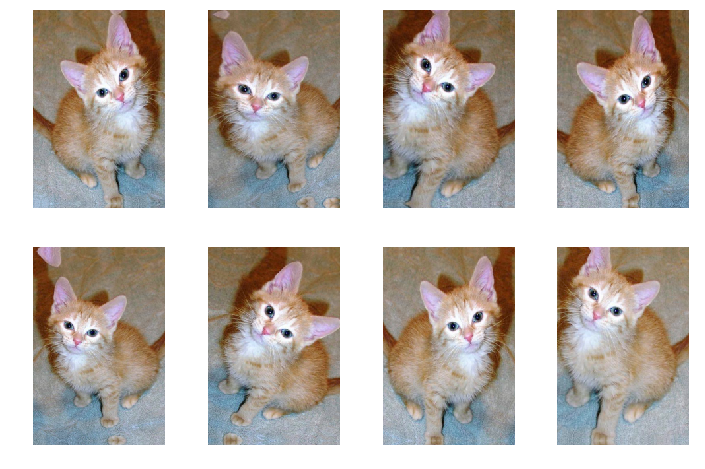

In [ ]:
plots_f(2, 4, 12, 8, size=(300,200))

The second argument that can be customized is how we treat missing pixels: when applying transforms (like a rotation), some of the pixels inside the square won't have values from the image. We can set missing pixels to one of the following:
- black (`padding_mode`='zeros')
- the value of the pixel at the nearest border (`padding_mode`='border')
- the value of the pixel symmetric to the nearest border (`padding_mode`='reflection')

`padding_mode`='reflection' is the default. Here is what `padding_mode`='zeros' looks like:

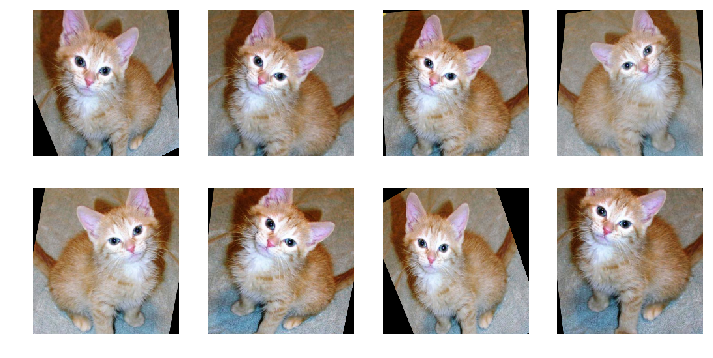

In [ ]:
plots_f(2, 4, 12, 6, size=224, padding_mode='zeros')

And here is what `padding_mode`='border' looks like:

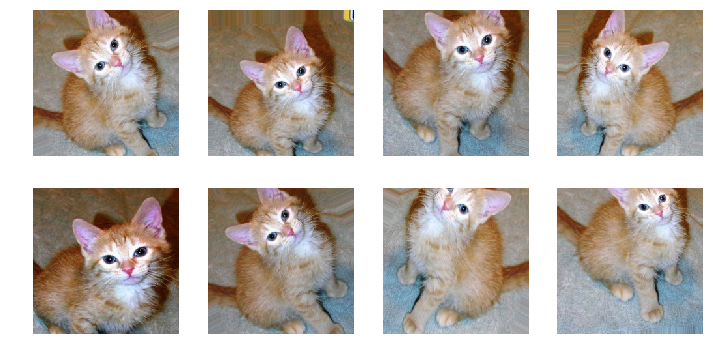

In [ ]:
plots_f(2, 4, 12, 6, size=224, padding_mode='border')

The third argument that might be useful to change is `do_crop`. Images are often rectangles of different ratios, so to get them to the target `size`, we can either take a random crop from the result of our transforms (`do_crop` = True, which is the default behavior), or add padding on the side(s) that needs to get bigger by specifying a value for `padding_mode`.

Here are the images with `do_crop`=False.

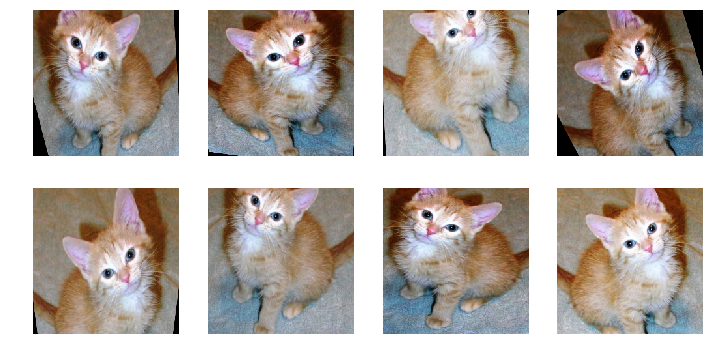

In [ ]:
plots_f(2, 4, 12, 6, size=224, do_crop=False, padding_mode='zeros')

You can also decide how your images are put to the final size by specifying a `resize_method`. By default, the library resize the image while keeping its original ratio so that the smaller size corresponds to the given size, then takes a crop (<code>ResizeMethod.CROP</code>). You can choose to resize the image while keeping its original ratio so that the bigger size corresponds to the given size, then take a pad (<code>ResizeeMethod.PAD</code>). Another way is to just squish the image to the given size (<code>ResizeeMethod.SQUISH</code>).

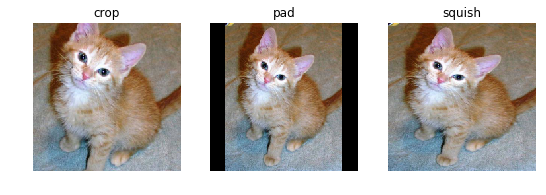

In [ ]:
_,axs = plt.subplots(1,3,figsize=(9,3))
for rsz,ax in zip([ResizeMethod.CROP, ResizeMethod.PAD, ResizeMethod.SQUISH], axs):
    get_ex().apply_tfms([crop_pad()], size=224, resize_method=rsz, padding_mode='zeros').show(ax=ax, title=rsz.name.lower())

## Data augmentation details

If you want to quickly get a set of random transforms that have proved to work well in a wide range of tasks, you should use the [`get_transforms`](/vision.transform.html#get_transforms) function. The most important parameters to adjust are *do\_flip* and *flip\_vert*, depending on the type of images you have.

In [ ]:
show_doc(get_transforms,  arg_comments={
    'do_flip': 'if True, a random flip is applied with probability 0.5',
    'flip_vert': 'requires do_flip=True. If True, the image can be flipped vertically or rotated of 90 degrees, otherwise only an horizontal flip is applied',
    'max_rotate': 'if not None, a random rotation between -max\_rotate and max\_rotate degrees is applied with probability p\_affine',
    'max_zoom': 'if not 1. or less, a random zoom betweem 1. and max\_zoom is applied with probability p\_affine',
    'max_lighting': 'if not None, a random lightning and contrast change controlled by max\_lighting is applied with probability p\_lighting',
    'max_warp': 'if not None, a random symmetric warp of magnitude between -max\_warp and maw\_warp is applied with probability p\_affine',    
    'p_affine': 'the probability that each affine transform and symmetric warp is applied',
    'p_lighting': 'the probability that each lighting transform is applied',
    'xtra_tfms': 'a list of additional transforms you would like to be applied'
})

<h4 id="get_transforms"><code>get_transforms</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L252" class="source_link">[source]</a></h4>

> <code>get_transforms</code>(`do_flip`:`bool`=`True`, `flip_vert`:`bool`=`False`, `max_rotate`:`float`=`10.0`, `max_zoom`:`float`=`1.1`, `max_lighting`:`float`=`0.2`, `max_warp`:`float`=`0.2`, `p_affine`:`float`=`0.75`, `p_lighting`:`float`=`0.75`, `xtra_tfms`:`Optional`\[`Collection`\[[`Transform`](/vision.image.html#Transform)\]\]=`None`) → `Collection`\[[`Transform`](/vision.image.html#Transform)\]

Utility func to easily create a list of flip, rotate, [`zoom`](/vision.transform.html#zoom), warp, lighting transforms. 

- *do_flip*: if True, a random flip is applied with probability 0.5
- *flip_vert*: requires do_flip=True. If True, the image can be flipped vertically or rotated of 90 degrees, otherwise only an horizontal flip is applied
- *max_rotate*: if not None, a random rotation between -max\_rotate and max\_rotate degrees is applied with probability p\_affine
- *max_zoom*: if not 1. or less, a random zoom betweem 1. and max\_zoom is applied with probability p\_affine
- *max_lighting*: if not None, a random lightning and contrast change controlled by max\_lighting is applied with probability p\_lighting
- *max_warp*: if not None, a random symmetric warp of magnitude between -max\_warp and maw\_warp is applied with probability p\_affine
- *p_affine*: the probability that each affine transform and symmetric warp is applied
- *p_lighting*: the probability that each lighting transform is applied
- *xtra_tfms*: a list of additional transforms you would like to be applied 

This function returns a tuple of two list of transforms, one for the training set and the other for the validation set (which is limited to a center crop by default. 

In [ ]:
tfms = get_transforms(max_rotate=25); len(tfms)

2

Let's see how [`get_transforms`](/vision.transform.html#get_transforms) changes this little kitten now.

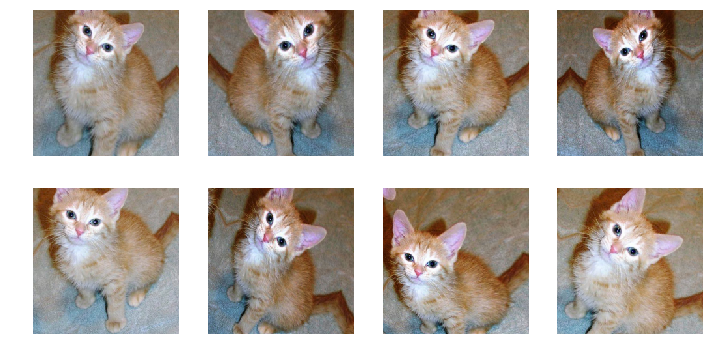

In [ ]:
plots_f(2, 4, 12, 6, size=224)

Another useful function that gives basic transforms is [`zoom_crop`](/vision.transform.html#zoom_crop):

In [ ]:
show_doc(zoom_crop, arg_comments={
    'scale': 'Decimal or range of decimals to zoom the image',
    'do_rand': "If true, transform is randomized, otherwise it's a `zoom` of `scale` and a center crop",
    'p': 'Probability to apply the zoom'
})

<h4 id="zoom_crop"><code>zoom_crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L174" class="source_link">[source]</a></h4>

> <code>zoom_crop</code>(`scale`:`float`, `do_rand`:`bool`=`False`, `p`:`float`=`1.0`)

Randomly zoom and/or crop. 

- *scale*: Decimal or range of decimals to zoom the image
- *do_rand*: If true, transform is randomized, otherwise it's a `zoom` of `scale` and a center crop
- *p*: Probability to apply the zoom 

`scale` should be a given float if `do_rand` is false, otherwise it can be a range of floats (and the zoom will have a random value inbetween). Again, here is a sense of what this can give us.

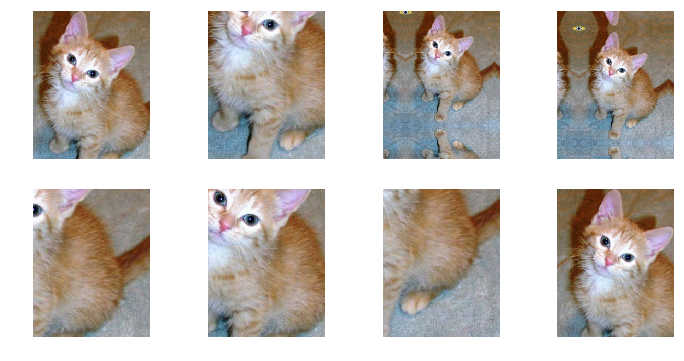

In [ ]:
tfms = zoom_crop(scale=(0.75,2), do_rand=True)
plots_f(2, 4, 12, 6, size=224)

In [ ]:
show_doc(rand_resize_crop, ignore_warn=True, arg_comments={
    'size': 'Final size of the image',
    'max_scale': 'Zooms the image to a random scale up to this',
    'ratios': 'Range of ratios in which a new one will be randomly picked'
})

<h4 id="rand_resize_crop"><code>rand_resize_crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L291" class="source_link">[source]</a></h4>

> <code>rand_resize_crop</code>(`size`:`int`, `max_scale`:`float`=`2.0`, `ratios`:`Point`=`(0.75, 1.33)`)

Randomly resize and crop the image to a ratio in `ratios` after a zoom of `max_scale`. 

- *size*: Final size of the image
- *max_scale*: Zooms the image to a random scale up to this
- *ratios*: Range of ratios in which a new one will be randomly picked 

This transform is an implementation of the main approach used for nearly all winning Imagenet entries since 2013, based on Andrew Howard's [Some Improvements on Deep Convolutional Neural Network Based Image Classification](https://arxiv.org/abs/1312.5402). It determines a new width and height of the image after the random scale and squish to the new ratio are applied. Those are switched with probability 0.5. Then we return the part of the image with the width and height computed, centered in `row_pct`, `col_pct` if width and height are both less than the corresponding size of the image. Otherwise we try again with new random parameters.

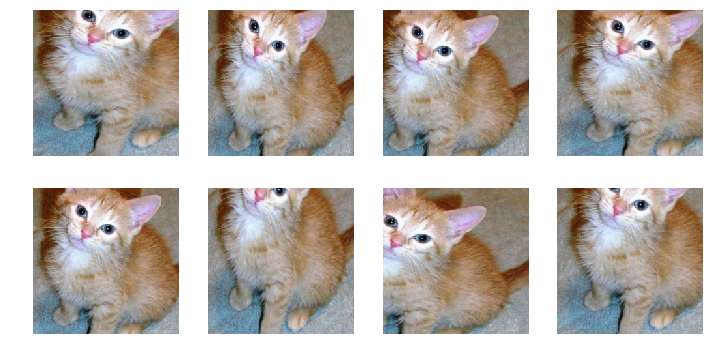

In [ ]:
tfms = [rand_resize_crop(224)]
plots_f(2, 4, 12, 6, size=224)

## Randomness

The functions that define each transform, such as [`rotate`](/vision.transform.html#rotate)or [`flip_lr`](/vision.transform.html#flip_lr) are deterministic. The fastai library will then randomize them in two different ways:
- each transform can be defined with an argument named `p` representing the probability for it to be applied
- each argument that is type-annoted with a random function (like [`uniform`](/vision.image.html#uniform) or [<code>rand_bool</code>](http://docs.fast.ai/vision.image.html#rand_bool)) can be replaced by a tuple of arguments accepted by this function, and on each call of the transform, the argument that is passed inside the function will be picked randomly using that random function.

If we look at the function [`rotate`](/vision.transform.html#rotate) for instance, we see it had an argument `degrees` that is type-annotated as uniform.

**First level of randomness:** We can define a transform using [`rotate`](/vision.transform.html#rotate) with `degrees` fixed to a value, but by passing an argument `p`. The rotation will then be executed with a probability of `p` but always with the same value of `degrees`.

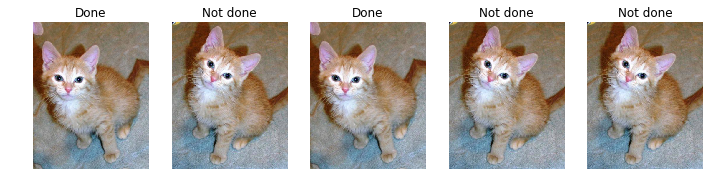

In [ ]:
tfm = [rotate(degrees=30, p=0.5)]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_ex().apply_tfms(tfm)
    title = 'Done' if tfm[0].do_run else 'Not done'
    img.show(ax=ax, title=title)

**Second level of randomness**: We can define a transform using [`rotate`](/vision.transform.html#rotate) with `degrees` defined as a range, without an argument `p`. The rotation will then always be executed with a random value picked uniformly between the two floats we put in `degrees`.

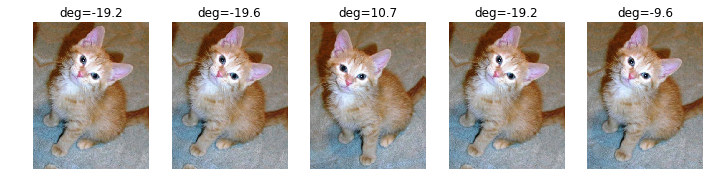

In [ ]:
tfm = [rotate(degrees=(-30,30))]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_ex().apply_tfms(tfm)
    title = f"deg={tfm[0].resolved['degrees']:.1f}"
    img.show(ax=ax, title=title)

**All combined**: We can define a transform using [`rotate`](/vision.transform.html#rotate) with `degrees` defined as a range, and an argument `p`. The rotation will then always be executed with a probability `p` and a random value picked uniformly between the two floats we put in `degrees`.

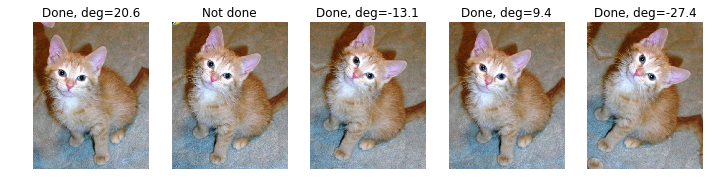

In [ ]:
tfm = [rotate(degrees=(-30,30), p=0.75)]
fig, axs = plt.subplots(1,5,figsize=(12,4))
for ax in axs:
    img = get_ex().apply_tfms(tfm)
    title = f"Done, deg={tfm[0].resolved['degrees']:.1f}" if tfm[0].do_run else f'Not done'
    img.show(ax=ax, title=title)

## List of transforms

Here is the list of all the deterministic functions on which the transforms are built. As explained before, each of those can have a probability `p` of being executed, and any time an argument is type-annotated with a random function, it's possible to randomize it via that function.

In [ ]:
show_doc(brightness)

<h4 id="brightness"><code>brightness</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L12" class="source_link">[source]</a></h4>

> <code>brightness</code>(`x`, `change`:[`uniform`](/vision.image.html#uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmLighting`](/vision.image.html#TfmLighting)

Apply `change` in brightness of image `x`.  

This transform adjusts the brightness of the image depending on the value in `change`. A `change` of 0 will transform the image to black and a `change` of 1 will transform the image to white. `change`=0.5 doesn't do adjust the brightness.

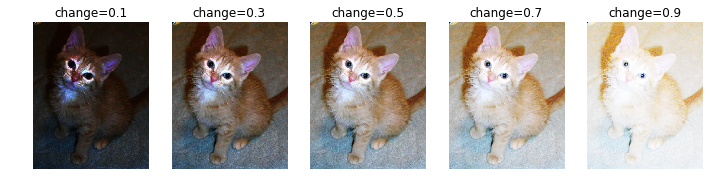

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for change, ax in zip(np.linspace(0.1,0.9,5), axs):
    brightness(get_ex(), change).show(ax=ax, title=f'change={change:.1f}')

In [ ]:
show_doc(contrast)

<h4 id="contrast"><code>contrast</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L17" class="source_link">[source]</a></h4>

> <code>contrast</code>(`x`, `scale`:[`log_uniform`](/vision.image.html#log_uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmLighting`](/vision.image.html#TfmLighting)

Apply `scale` to contrast of image `x`.  

`scale` adjusts the contrast. A `scale` of 0 will transform the image to grey and a `scale` over 1 will transform the picture to super-contrast. `scale` = 1. doesn't adjust the contrast.

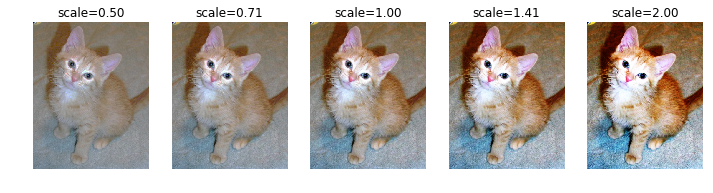

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.exp(np.linspace(log(0.5),log(2),5)), axs):
    contrast(get_ex(), scale).show(ax=ax, title=f'scale={scale:.2f}')

In [ ]:
show_doc(crop)

<h4 id="crop"><code>crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L109" class="source_link">[source]</a></h4>

> <code>crop</code>(`x`, `size`, `row_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`, `col_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

Crop `x` to `size` pixels. `row_pct`,`col_pct` select focal point of crop.  

This transform takes a crop of the image to return one of the given size. The position is given by `(col_pct, row_pct)`, with `col_pct` and `row_pct` being normalized between 0. and 1.

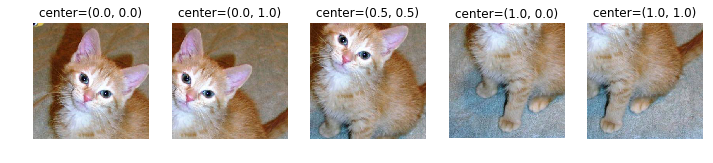

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for center, ax in zip([[0.,0.], [0.,1.],[0.5,0.5],[1.,0.], [1.,1.]], axs):
    crop(get_ex(), 300, *center).show(ax=ax, title=f'center=({center[0]}, {center[1]})')

In [ ]:
show_doc(crop_pad, ignore_warn=True, arg_comments={
    'x': 'Image to transform',
    'size': "Size of the crop, if it's an int, the crop will be square",
    'padding_mode': "How to pad the output image ('zeros', 'border' or 'reflection')",
    'row_pct': 'Between 0. and 1., position of the center on the y axis (0. is top, 1. is bottom, 0.5 is center)',
    'col_pct': 'Between 0. and 1., position of the center on the x axis (0. is left, 1. is right, 0.5 is center)'
})

<h4 id="crop_pad"><code>crop_pad</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L130" class="source_link">[source]</a></h4>

> <code>crop_pad</code>(`x`, `size`, `padding_mode`=`'reflection'`, `row_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`, `col_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`) → [`Image`](/vision.image.html#Image) :: [`TfmCrop`](/vision.image.html#TfmCrop)

Crop and pad tfm - `row_pct`,`col_pct` sets focal point. 

- *x*: Image to transform
- *size*: Size of the crop, if it's an int, the crop will be square
- *padding_mode*: How to pad the output image ('zeros', 'border' or 'reflection')
- *row_pct*: Between 0. and 1., position of the center on the y axis (0. is top, 1. is bottom, 0.5 is center)
- *col_pct*: Between 0. and 1., position of the center on the x axis (0. is left, 1. is right, 0.5 is center) 

This works like [`crop`](/vision.transform.html#crop) but if the target size is bigger than the size of the image (on either dimension), padding is applied according to `padding_mode` (see [`pad`](/vision.transform.html#pad) for an example of all the options) and the position of center is ignored on that dimension.

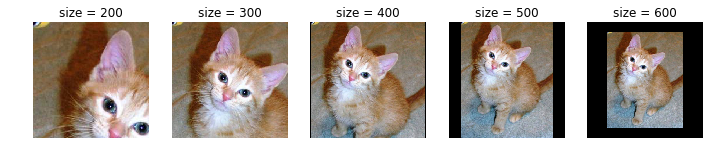

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for size, ax in zip(np.linspace(200,600,5), axs):
    crop_pad(get_ex(), int(size), 'zeros', 0.,0.).show(ax=ax, title=f'size = {int(size)}')

In [ ]:
show_doc(dihedral)

<h4 id="dihedral"><code>dihedral</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L69" class="source_link">[source]</a></h4>

> <code>dihedral</code>(`x`, `k`:`partial(<function uniform_int at 0x7fade1047488>, 0, 8)`) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

Randomly flip `x` image based on `k`.  

This transform applies combines a flip (horizontal or vertical) and a rotation of a multiple of 90 degrees.

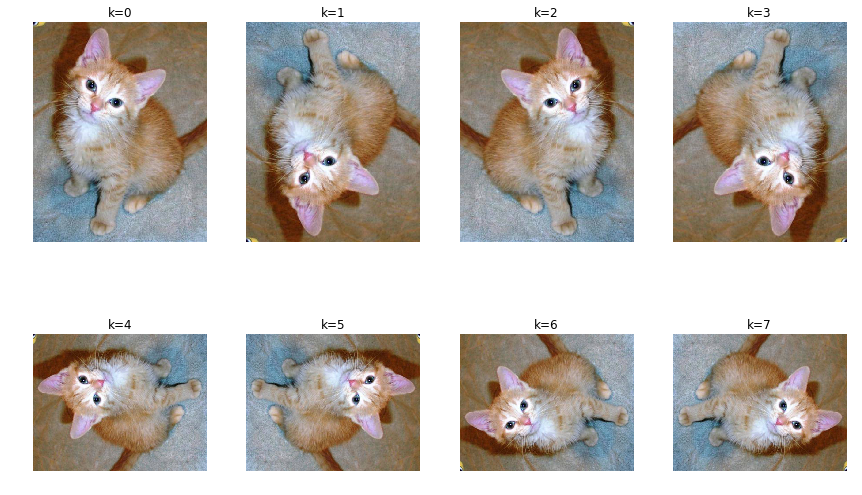

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for k, ax in enumerate(axs.flatten()):
    dihedral(get_ex(), k).show(ax=ax, title=f'k={k}')
plt.tight_layout()

In [ ]:
show_doc(dihedral_affine)

<h4 id="dihedral_affine"><code>dihedral_affine</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L79" class="source_link">[source]</a></h4>

> <code>dihedral_affine</code>(`k`:`partial(<function uniform_int at 0x7fade1047488>, 0, 8)`) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

Randomly flip `x` image based on `k`.  

This is an affine implementation of [`dihedral`](/vision.transform.html#dihedral) that should be used if the target is an [`ImagePoints`](/vision.image.html#ImagePoints) or an [`ImageBBox`](/vision.image.html#ImageBBox).

In [ ]:
show_doc(flip_lr)

<h4 id="flip_lr"><code>flip_lr</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L60" class="source_link">[source]</a></h4>

> <code>flip_lr</code>(`x`) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

This transform horizontally flips the image. [`flip_lr`](/vision.transform.html#flip_lr) mirrors the image.

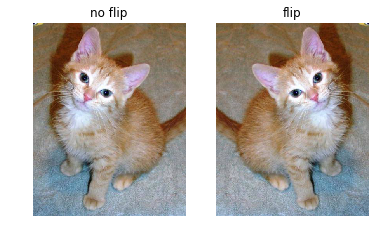

In [ ]:
fig, axs = plt.subplots(1,2,figsize=(6,4))
get_ex().show(ax=axs[0], title=f'no flip')
flip_lr(get_ex()).show(ax=axs[1], title=f'flip')

In [ ]:
show_doc(flip_affine)

<h4 id="flip_affine"><code>flip_affine</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L63" class="source_link">[source]</a></h4>

> <code>flip_affine</code>() → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

This is an affine implementation of [`flip_lr`](/vision.transform.html#flip_lr) that should be used if the target is an [`ImagePoints`](/vision.image.html#ImagePoints) or an [`ImageBBox`](/vision.image.html#ImageBBox).

In [ ]:
show_doc(jitter, doc_string=False)

<h4 id="jitter"><code>jitter</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L54" class="source_link">[source]</a></h4>

> <code>jitter</code>(`c`, `magnitude`:[`uniform`](/vision.image.html#uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

This transform changes the pixels of the image by randomly replacing them with pixels from the neighborhood (how far the neighborhood extends is controlled by the value of `magnitude`).

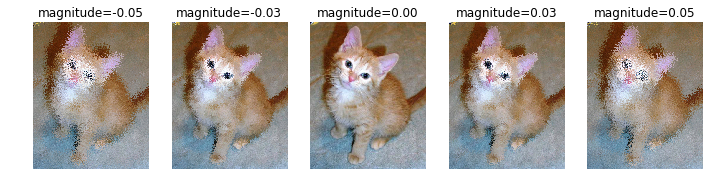

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for magnitude, ax in zip(np.linspace(-0.05,0.05,5), axs):
    tfm = jitter(magnitude=magnitude)
    get_ex().jitter(magnitude).show(ax=ax, title=f'magnitude={magnitude:.2f}')

In [ ]:
show_doc(pad)

<h4 id="pad"><code>pad</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L98" class="source_link">[source]</a></h4>

> <code>pad</code>(`x`, `padding`:`int`, `mode`=`'reflection'`) → [`Image`](/vision.image.html#Image) :: [`TfmPixel`](/vision.image.html#TfmPixel)

Pad `x` with `padding` pixels. `mode` fills in space ('zeros','reflection','border').  

Pads the image by adding `padding` pixel on each side of the picture accordin to `mode`:
- `mode` = zeros -  pads with zeros, 
- `mode` = border - repeats the pixels at the border.
- `mode` = reflection - pads by taking the pixels symmetric to the border.

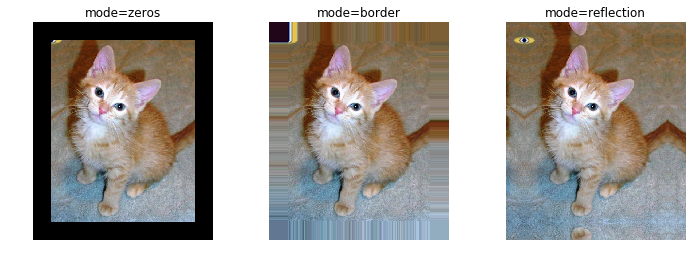

In [ ]:
fig, axs = plt.subplots(1,3,figsize=(12,4))
for mode, ax in zip(['zeros', 'border', 'reflection'], axs):
    pad(get_ex(), 50, mode).show(ax=ax, title=f'mode={mode}')

In [ ]:
show_doc(perspective_warp)

<h4 id="perspective_warp"><code>perspective_warp</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L212" class="source_link">[source]</a></h4>

> <code>perspective_warp</code>(`c`, `magnitude`:`partial(<function uniform at 0x7fade10472f0>, size=8)`=`0`, `invert`=`False`) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

Apply warp of `magnitude` to `c`.  

Perspective warping is a deformation of the image as seen in a different plane of the 3D-plane. The new plane is determined by telling where we want each of the four corners of the image (from -1 to 1, -1 being left/top, 1 being right/bottom).

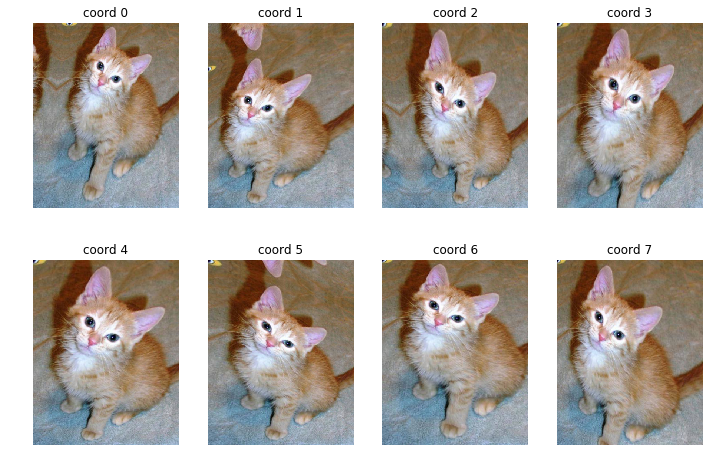

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for i, ax in enumerate(axs.flatten()):
    magnitudes = torch.tensor(np.zeros(8))
    magnitudes[i] = 0.5
    perspective_warp(get_ex(), magnitudes).show(ax=ax, title=f'coord {i}')

In [ ]:
show_doc(rotate)

<h4 id="rotate"><code>rotate</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L22" class="source_link">[source]</a></h4>

> <code>rotate</code>(`degrees`:[`uniform`](/vision.image.html#uniform)) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

Rotate image by `degrees`.  

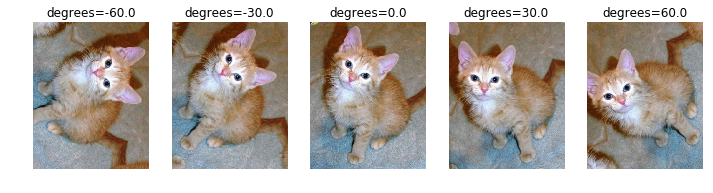

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for deg, ax in zip(np.linspace(-60,60,5), axs):
    get_ex().rotate(degrees=deg).show(ax=ax, title=f'degrees={deg}')

In [ ]:
show_doc(skew)

<h4 id="skew"><code>skew</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L237" class="source_link">[source]</a></h4>

> <code>skew</code>(`c`, `direction`:[`uniform_int`](/vision.image.html#uniform_int), `magnitude`:[`uniform`](/vision.image.html#uniform)=`0`, `invert`=`False`) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

Skew `c` field with random `direction` and `magnitude`.  

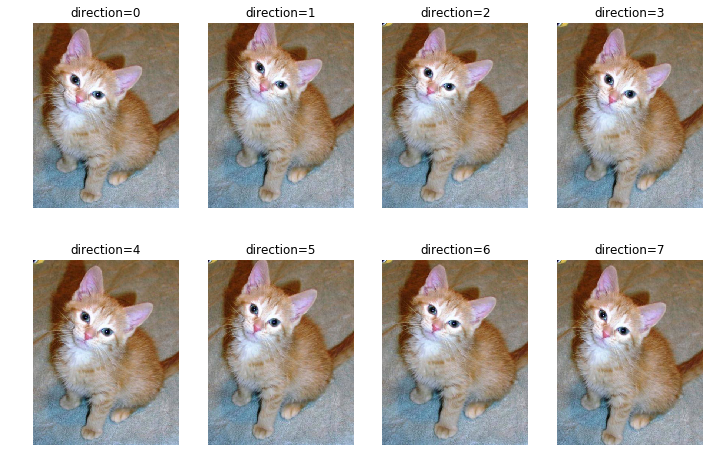

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for i, ax in enumerate(axs.flatten()):
    get_ex().skew(i, 0.2).show(ax=ax, title=f'direction={i}')

In [ ]:
show_doc(squish)

<h4 id="squish"><code>squish</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L44" class="source_link">[source]</a></h4>

> <code>squish</code>(`scale`:[`uniform`](/vision.image.html#uniform)=`1.0`, `row_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`, `col_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

Squish image by `scale`. `row_pct`,`col_pct` select focal point of zoom.  

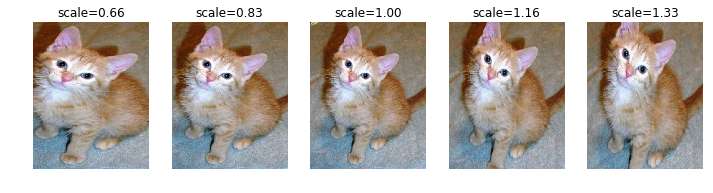

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.linspace(0.66,1.33,5), axs):
    get_ex().squish(scale=scale).show(ax=ax, title=f'scale={scale:.2f}')

In [ ]:
show_doc(symmetric_warp, doc_string=False)

<h4 id="symmetric_warp"><code>symmetric_warp</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L219" class="source_link">[source]</a></h4>

> <code>symmetric_warp</code>(`c`, `magnitude`:`partial(<function uniform at 0x7fade10472f0>, size=4)`=`0`, `invert`=`False`) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

Apply the four tilts at the same time, each with a strength given in the vector `magnitude`. See [`tilt`](/vision.transform.html#tilt) just below for the effect of each individual tilt.

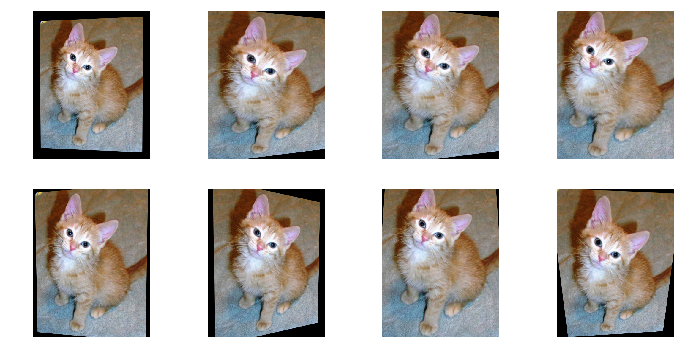

In [ ]:
tfm = symmetric_warp(magnitude=(-0.2,0.2))
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm, padding_mode='zeros')
    img.show(ax=ax)

In [ ]:
show_doc(tilt, doc_string=False)

<h4 id="tilt"><code>tilt</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L226" class="source_link">[source]</a></h4>

> <code>tilt</code>(`c`, `direction`:[`uniform_int`](/vision.image.html#uniform_int), `magnitude`:[`uniform`](/vision.image.html#uniform)=`0`, `invert`=`False`) → [`Image`](/vision.image.html#Image) :: [`TfmCoord`](/vision.image.html#TfmCoord)

Tilts `c` in the `direction` given (0: left, 1: right, 2: top, 3: bottom) with a certain `magnitude`. A positive number is a tilt forward (toward the person looking at the picture), a negative number a tilt backward.

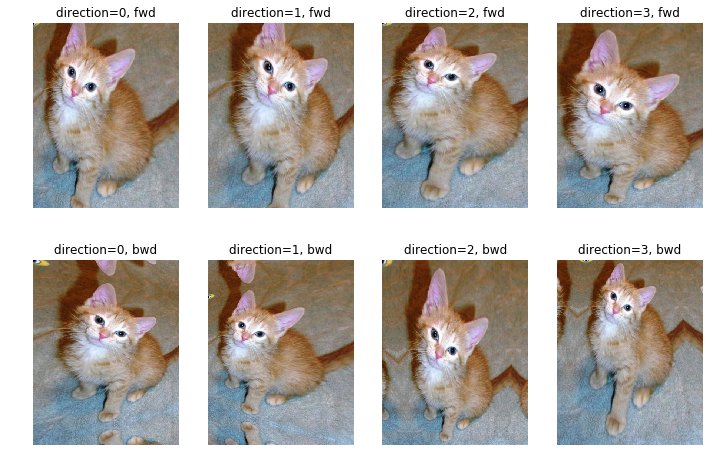

In [ ]:
fig, axs = plt.subplots(2,4,figsize=(12,8))
for i in range(4):
    get_ex().tilt(i, 0.4).show(ax=axs[0,i], title=f'direction={i}, fwd')
    get_ex().tilt(i, -0.4).show(ax=axs[1,i], title=f'direction={i}, bwd')

In [ ]:
show_doc(zoom)

<h4 id="zoom"><code>zoom</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L36" class="source_link">[source]</a></h4>

> <code>zoom</code>(`scale`:[`uniform`](/vision.image.html#uniform)=`1.0`, `row_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`, `col_pct`:[`uniform`](/vision.image.html#uniform)=`0.5`) → [`Image`](/vision.image.html#Image) :: [`TfmAffine`](/vision.image.html#TfmAffine)

Zoom image by `scale`. `row_pct`,`col_pct` select focal point of zoom.  

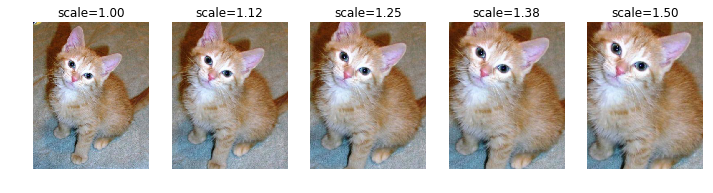

In [ ]:
fig, axs = plt.subplots(1,5,figsize=(12,4))
for scale, ax in zip(np.linspace(1., 1.5,5), axs):
    get_ex().zoom(scale=scale).show(ax=ax, title=f'scale={scale:.2f}')

## Convenience functions

These functions simplify creating random versions of [`crop_pad`](/vision.transform.html#crop_pad) and [`zoom`](/vision.transform.html#zoom).

In [ ]:
show_doc(rand_crop)

<h4 id="rand_crop"><code>rand_crop</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L170" class="source_link">[source]</a></h4>

> <code>rand_crop</code>(`args`, `kwargs`)

Randomized version of [`crop_pad`](/vision.transform.html#crop_pad).  

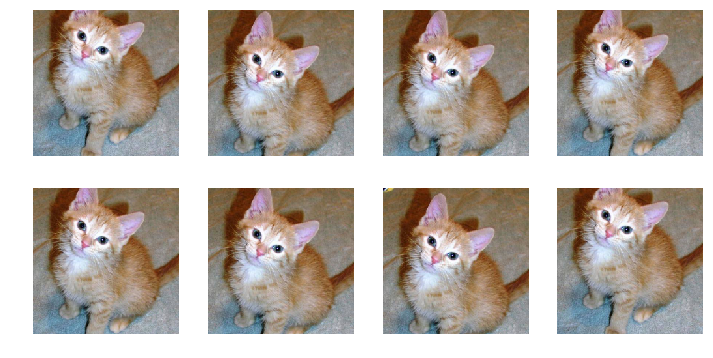

In [ ]:
tfm = rand_crop()
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm, size=224)
    img.show(ax=ax)

In [ ]:
show_doc(rand_zoom)

<h4 id="rand_zoom"><code>rand_zoom</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L166" class="source_link">[source]</a></h4>

> <code>rand_zoom</code>(`args`, `kwargs`)

Randomized version of [`zoom`](/vision.transform.html#zoom).  

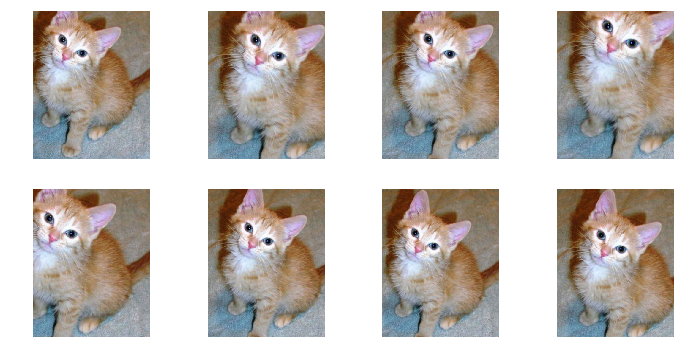

In [ ]:
tfm = rand_zoom(scale=(1.,1.5))
_, axs = plt.subplots(2,4,figsize=(12,6))
for ax in axs.flatten():
    img = get_ex().apply_tfms(tfm)
    img.show(ax=ax)

## Undocumented Methods - Methods moved below this line will intentionally be hidden

## New Methods - Please document or move to the undocumented section

In [ ]:
show_doc(rand_pad)

<h4 id="rand_pad"><code>rand_pad</code><a href="https://github.com/fastai/fastai/blob/master/fastai/vision/transform.py#L161" class="source_link">[source]</a></h4>

> <code>rand_pad</code>(`padding`:`int`, `size`:`int`, `mode`:`str`=`'reflection'`)

Fixed `mode` `padding` and random crop of `size`  